# From here

In [1]:
# from IPython.display import display, HTML
# display(HTML("<style>.container { width:80% !important; }</style>"))
%load_ext autotime

time: 0 ns (started: 2022-12-13 13:05:10 +09:00)


In [2]:
import numpy as np
import math
import tensorflow as tf
from sklearn.decomposition import PCA
from tensorflow.keras.models import Model
from tensorflow.keras import layers, losses
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
from numpy import savetxt
import pennylane as qml

time: 3.22 s (started: 2022-12-13 13:05:10 +09:00)


To see if the directory path is added to the sys.path, check `sys.path`

In [3]:
# Add directory path of the python-module files to import them.
import sys
# sys.path.insert(0,'/content/drive/MyDrive/qsvdd/QCNN_code_(working)/QCNN-main/Final_QCNN_mod')
sys.path

['C:\\Users\\user1\\Quantum\\qsvdd',
 'C:\\Users\\user1\\anaconda3\\python39.zip',
 'C:\\Users\\user1\\anaconda3\\DLLs',
 'C:\\Users\\user1\\anaconda3\\lib',
 'C:\\Users\\user1\\anaconda3',
 '',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\win32\\lib',
 'C:\\Users\\user1\\anaconda3\\lib\\site-packages\\Pythonwin']

time: 0 ns (started: 2022-12-13 13:05:13 +09:00)


# Data Preparation
- 'MNIST' data is a dataset of 60,000, 28$\times$28 grayscale images of the 10 digits, along with a test set of 10,000 images.
- Each pixel has grey scale value that ranges from 0 to 255.
- More info can be found at the [MNIST homepage](http://yann.lecun.com/exdb/mnist/).
- QCNN : https://github.com/takh04/QCNN/blob/main/README.md


- for "0" image classification
- resize images to 256 to fit with 8 qubits

In [4]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()


time: 156 ms (started: 2022-12-13 13:05:13 +09:00)


In [5]:
x_train.shape

(60000, 28, 28)

time: 0 ns (started: 2022-12-13 13:05:13 +09:00)


In [6]:
x_train, x_test = x_train[..., np.newaxis] / 255.0, x_test[..., np.newaxis] / 255.0  # normalize the data

time: 140 ms (started: 2022-12-13 13:05:13 +09:00)


In [7]:
x_train_filter_0 = np.where(y_train == 7)
x_test_filter_0 = np.where(y_test == 7)

X_train = x_train[x_train_filter_0]
X_test = x_test[x_test_filter_0]
Y_train = y_train[x_train_filter_0]
Y_test = y_test[x_test_filter_0]

time: 15 ms (started: 2022-12-13 13:05:13 +09:00)


In [8]:
X_train.shape

(6265, 28, 28, 1)

time: 0 ns (started: 2022-12-13 13:05:13 +09:00)


In [9]:
X_train = tf.image.resize(X_train[:], (256, 1)).numpy()
X_test = tf.image.resize(X_test[:], (256, 1)).numpy()
X_train, X_test = tf.squeeze(X_train).numpy(), tf.squeeze(X_test).numpy()

time: 63 ms (started: 2022-12-13 13:05:13 +09:00)


In [10]:
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(6265, 256)
(1028, 256)
(6265,)
(1028,)
time: 0 ns (started: 2022-12-13 13:05:13 +09:00)


In [11]:
center = qml.numpy.zeros([6], requires_grad=True)
center_train = np.tile(center,(len(X_train),1))
center_train

tensor([[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]], requires_grad=True)

time: 0 ns (started: 2022-12-13 13:05:13 +09:00)


In [12]:
%run ./qcnn_code/Angular_hybrid.py
%run ./qcnn_code/unitary.py
%run ./qcnn_code/embedding.py
%run ./qcnn_code/QCNN_circuit.py
%run ./qcnn_code/Training.py

time: 79 ms (started: 2022-12-13 13:05:13 +09:00)


In [13]:
train_Xdata = X_train
train_Ydata = center_train
conv_filter = 'U_SU4_no_pooling'
# parameter_weights = np.zeros(15)
num_params_conv = 15
data_encoding = 'Amplitude'
circuit_type = 'QCNN'
cost_func = 'svdd'
measure_basis = 'Z'

loss_history, est_params, param_history = circuit_training(X_train=train_Xdata,
                                            Y_train=train_Ydata,
                                            U=conv_filter,
                                            U_params=num_params_conv,
                                            embedding_type=data_encoding,
                                            circuit=circuit_type,
                                            cost_fn=cost_func,
                                            measure_axis=measure_basis)

C:\Users\user1\anaconda3\lib\site-packages\autograd\numpy\numpy_vjps.py:698: ComplexWarning: Casting complex values to real discards the imaginary part
  onp.add.at(A, idx, x)


iteration:  0  cost:  0.21806186623203233
iteration:  5  cost:  0.22199783940983409
iteration:  10  cost:  0.16061510547866553
iteration:  15  cost:  0.15407903055152034
iteration:  20  cost:  0.14354168576027548
iteration:  25  cost:  0.09269992796634398
iteration:  30  cost:  0.08844072137420507
iteration:  35  cost:  0.12414229911605852
iteration:  40  cost:  0.07070259559629362
iteration:  45  cost:  0.08277463758944116
iteration:  50  cost:  0.048704205358972144
iteration:  55  cost:  0.04387803694125373
iteration:  60  cost:  0.06979052300875789
iteration:  65  cost:  0.05530900914918663
iteration:  70  cost:  0.05373224689320282
iteration:  75  cost:  0.03778457071989995
iteration:  80  cost:  0.07048847234055652
iteration:  85  cost:  0.026078394502864317
iteration:  90  cost:  0.03747294653636557
iteration:  95  cost:  0.058487041086709
iteration:  100  cost:  0.03922506080515214
iteration:  105  cost:  0.02065931636646315
iteration:  110  cost:  0.02652773732586927
iteration:

In [14]:
# from pennylane import numpy as np
# est_params = np.random.randn(45, requires_grad = True)
est_params

tensor([ 1.50410848,  1.02427763, -1.73405993,  0.45901207,  0.74784198,
        -0.62579958,  0.11899458,  0.14886089,  0.03003422, -1.72184287,
         0.84020237,  0.87056186, -2.16986683,  0.29023737,  0.03807518,
         0.17071377, -1.00913334, -2.21839292, -0.92680261, -0.39779185,
         1.26078224, -0.07004828,  0.7902026 , -0.85865473,  1.66881813,
         0.35491669,  1.21596101, -0.93908503,  1.71717899, -1.73526339,
        -1.20148076, -0.90531082, -0.88646692, -1.09566325, -0.80455981,
        -0.45493506, -0.43859017,  1.16009567, -0.24876893, -1.84006261,
         0.15099741,  1.29029763, -0.88427303,  0.4766385 , -0.13074005,
        -0.37962896, -0.78237413, -0.68735482, -1.02358475,  0.04575379,
         1.39492924, -0.63007349,  0.30864284, -0.02587417,  1.1787626 ,
         0.18845852, -1.13115863, -0.51782792, -1.04294104,  0.51481094,
        -0.97515275, -0.88262467,  0.61815081, -0.54011431, -1.69618068,
        -0.34973943,  0.22847446, -0.22481519, -0.0

time: 15 ms (started: 2022-12-14 02:41:08 +09:00)


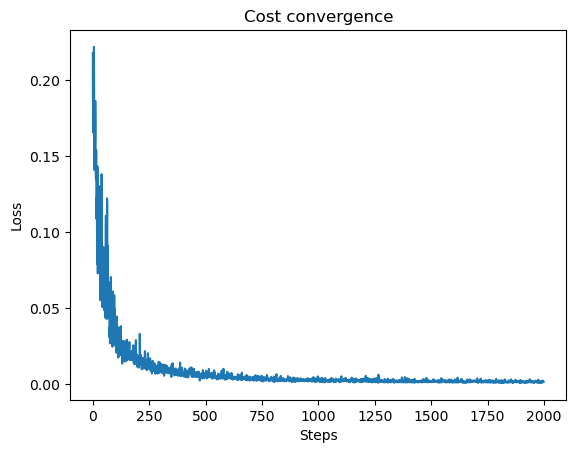

time: 437 ms (started: 2022-12-14 02:41:08 +09:00)


In [15]:
plt.plot(loss_history)
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Cost convergence")

plt.savefig('./img/OCC7/qsvdd/cost_qcnn.png')

In [16]:
savetxt('./img/OCC7/qsvdd/param_list_qcnn',est_params.numpy(),delimiter=',')

time: 16 ms (started: 2022-12-14 02:41:09 +09:00)


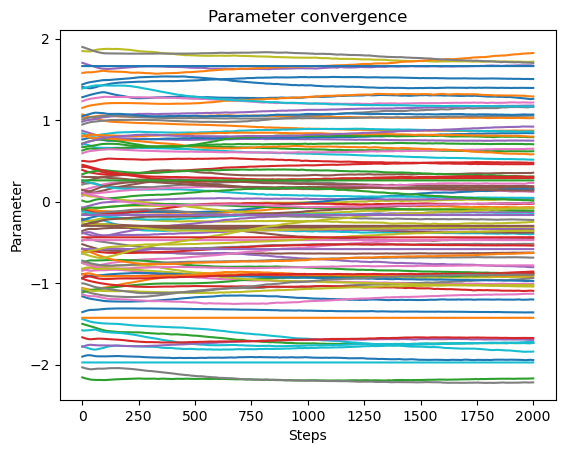

time: 500 ms (started: 2022-12-14 02:41:09 +09:00)


In [17]:
plt.plot(param_history)
plt.xlabel("Steps")
plt.ylabel("Parameter")
plt.title("Parameter convergence")
plt.savefig('./img/OCC7/qsvdd/parameters_qcnn.png')

### train result

In [18]:
# Implement trained circuit for MNIST "7" train data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_train])

time: 1h 1min 13s (started: 2022-12-14 02:41:09 +09:00)


In [19]:
predictions_exp0

tensor([[-0.0115105 ,  0.01062451, -0.00420129,  0.00745369, -0.00943577,
         -0.00058138],
        [-0.0010208 ,  0.00063763,  0.02119115,  0.01313842,  0.00018342,
         -0.00445918],
        [-0.00613235, -0.00696255, -0.03390111,  0.01954825, -0.04512939,
         -0.00976465],
        ...,
        [ 0.0046268 ,  0.00875688, -0.00828808,  0.01279229, -0.02080229,
          0.00473959],
        [ 0.02687194, -0.01324848, -0.01044919,  0.00172987,  0.00272049,
          0.00864253],
        [-0.03309735,  0.02079478, -0.01547581,  0.03049621,  0.00713084,
         -0.00615877]], requires_grad=True)

time: 0 ns (started: 2022-12-14 03:42:22 +09:00)


In [20]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]

time: 9.86 s (started: 2022-12-14 03:42:22 +09:00)


In [21]:
# center = center.detach().numpy()

time: 0 ns (started: 2022-12-14 03:42:32 +09:00)


In [22]:
# center[0]

time: 0 ns (started: 2022-12-14 03:42:32 +09:00)


In [23]:
predictions_exp = 0

time: 0 ns (started: 2022-12-14 03:42:32 +09:00)


In [24]:
import plotly.express as px
import plotly.graph_objects as go


df = predictions_exp
label_value_string = np.array(Y_train).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0[:,0], 
                          y = predictions_exp0[:,1], 
                          z = predictions_exp0[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)


fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)

fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()
fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_train.html')
# fig_test_ploty.write_html('Result/ploty_figure_test.html')

time: 15 s (started: 2022-12-14 03:42:32 +09:00)


In [25]:
# L1-norm of trained MNIST "0" train data
abs(predictions_exp0 - center).mean(axis=1).mean()

tensor(0.01160702, requires_grad=True)

time: 16 ms (started: 2022-12-14 03:42:47 +09:00)


In [26]:
score_train = abs(predictions_exp0 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 03:42:47 +09:00)


In [27]:
score_var_train = abs(predictions_exp0 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 03:42:47 +09:00)


### score for test data

In [28]:
# Implement trained circuit for MNIST "0" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp0_test = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X_test])

time: 10min 1s (started: 2022-12-14 03:42:47 +09:00)


In [29]:
print(predictions_exp0_test)
print(predictions_exp0_test.shape)

[[ 0.00088119 -0.00632854  0.0217198   0.00036128 -0.01636858 -0.00104179]
 [ 0.00689831 -0.00693123  0.02908645  0.00101008 -0.001648   -0.00223705]
 [-0.02078228  0.01400858 -0.02032731 -0.03939498  0.06968088 -0.01204957]
 ...
 [ 0.00292534  0.01006349 -0.006445   -0.00560754 -0.00772436 -0.00390167]
 [-0.00764637  0.01592069 -0.00861751  0.00413428 -0.01239437 -0.01357133]
 [-0.00065478 -0.00278817 -0.00781497 -0.00424127  0.00294178 -0.01435602]]
(1028, 6)
time: 15 ms (started: 2022-12-14 03:52:49 +09:00)


In [30]:
score_test0 = abs(predictions_exp0_test - center).mean(axis=1).mean()

time: 16 ms (started: 2022-12-14 03:52:49 +09:00)


In [31]:
score_var_test0 = abs(predictions_exp0_test - center).mean(axis=1)


time: 15 ms (started: 2022-12-14 03:52:49 +09:00)


In [32]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 03:52:49 +09:00)


In [33]:
import plotly.express as px
import plotly.graph_objects as go


df = predictions_exp
label_value_string = np.array(Y_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp0_test[:,0], 
                          y = predictions_exp0_test[:,1], 
                          z = predictions_exp0_test[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
# fig_ploty.update_layout(scene = dict(xaxis = dict(nticks=10, range=[-1,1],),
#                                      yaxis = dict(nticks=4, range=[-1,1],),
#                                      zaxis = dict(nticks=4, range=[-1,1],),),
#                         margin=dict(r=10, l=10, b=10, t=10))
fig_ploty.update_traces(marker_size = 1.5)
# fig_ploty.show()

fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_test.html')

time: 203 ms (started: 2022-12-14 03:52:49 +09:00)


### score for test0

In [34]:
x_train_filter_1 = np.where(y_train == 0)
x_test_filter_1 = np.where(y_test == 0)

X1_train = x_train[x_train_filter_1]
X1_test = x_test[x_test_filter_1]
Y1_train = y_train[x_train_filter_1]
Y1_test = y_test[x_test_filter_1]

time: 32 ms (started: 2022-12-14 03:52:49 +09:00)


In [35]:
X1_train.shape

(5923, 28, 28, 1)

time: 0 ns (started: 2022-12-14 03:52:49 +09:00)


In [36]:
X1_train = tf.image.resize(X1_train[:], (256, 1)).numpy()
X1_test = tf.image.resize(X1_test[:], (256, 1)).numpy()
X1_train, X1_test = tf.squeeze(X1_train).numpy(), tf.squeeze(X1_test).numpy()

time: 31 ms (started: 2022-12-14 03:52:49 +09:00)


In [37]:
print(X1_train.shape)
print(X1_test.shape)
print(Y1_train.shape)
print(Y1_test.shape)

(5923, 256)
(980, 256)
(5923,)
(980,)
time: 0 ns (started: 2022-12-14 03:52:49 +09:00)


In [38]:
# Implement trained circuit for MNIST "1" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp1 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X1_test])

time: 9min 38s (started: 2022-12-14 03:52:49 +09:00)


In [39]:
print(predictions_exp1)
print(predictions_exp1.shape)

[[-0.00678843 -0.0372309   0.02799687  0.03398225 -0.04651241 -0.03910751]
 [-0.01340063 -0.01546183  0.04128502  0.03876605 -0.00279401 -0.06364036]
 [-0.01867565 -0.01403219 -0.01288193 -0.02809939  0.02309359 -0.03781425]
 ...
 [ 0.03600111  0.0022367   0.01509101  0.03094833  0.0013378   0.04536872]
 [-0.00452292 -0.02123712  0.02345923  0.00295659  0.00842321 -0.02894338]
 [-0.00323665 -0.03833233  0.01026783 -0.0255239  -0.03188931  0.01173303]]
(980, 6)
time: 0 ns (started: 2022-12-14 04:02:28 +09:00)


In [40]:
# L1-norm of MNIST "1"
abs(predictions_exp1 - center).mean(axis=1).mean()

tensor(0.02340832, requires_grad=True)

time: 15 ms (started: 2022-12-14 04:02:28 +09:00)


In [41]:
score_test1 = abs(predictions_exp1 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:02:28 +09:00)


In [42]:
score_var_test1 = abs(predictions_exp1 - center).mean(axis=1)

time: 15 ms (started: 2022-12-14 04:02:28 +09:00)


In [43]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:02:28 +09:00)


In [44]:
df = predictions_exp
label_value_string = np.array(Y1_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp1[:,0], 
                          y = predictions_exp1[:,1], 
                          z = predictions_exp1[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_test0.html')

time: 218 ms (started: 2022-12-14 04:02:28 +09:00)


### score for test1

In [45]:
x_train_filter_2 = np.where(y_train == 1)
x_test_filter_2 = np.where(y_test == 1)

X2_train = x_train[x_train_filter_2]
X2_test = x_test[x_test_filter_2]
Y2_train = y_train[x_train_filter_2]
Y2_test = y_test[x_test_filter_2]

time: 47 ms (started: 2022-12-14 04:02:28 +09:00)


In [46]:
X2_train.shape

(6742, 28, 28, 1)

time: 16 ms (started: 2022-12-14 04:02:28 +09:00)


In [47]:
X2_train = tf.image.resize(X2_train[:], (256, 1)).numpy()
X2_test = tf.image.resize(X2_test[:], (256, 1)).numpy()
X2_train, X2_test = tf.squeeze(X2_train).numpy(), tf.squeeze(X2_test).numpy()

time: 31 ms (started: 2022-12-14 04:02:28 +09:00)


In [48]:
print(X2_train.shape)
print(X2_test.shape)
print(Y2_train.shape)
print(Y2_test.shape)

(6742, 256)
(1135, 256)
(6742,)
(1135,)
time: 0 ns (started: 2022-12-14 04:02:28 +09:00)


In [49]:
# Implement trained circuit for MNIST "2" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp2 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X2_test])

time: 11min 11s (started: 2022-12-14 04:02:28 +09:00)


In [50]:
print(predictions_exp2)
print(predictions_exp2.shape)

[[ 0.00606166 -0.02610384  0.03642622 -0.02550809  0.0138069   0.02426646]
 [ 0.00104509 -0.01822238  0.03213148 -0.0317803   0.01825441  0.03032901]
 [ 0.00539126 -0.02901548  0.04566624 -0.01100092 -0.01979519 -0.04441932]
 ...
 [-0.01036625 -0.02684046  0.02054435  0.00206939 -0.00755188  0.05013827]
 [ 0.0095368  -0.01484753  0.01004445 -0.02437825  0.01108745 -0.0060726 ]
 [ 0.00765982 -0.01423814  0.02691718 -0.02530967  0.02132178  0.00713508]]
(1135, 6)
time: 0 ns (started: 2022-12-14 04:13:40 +09:00)


In [51]:
# L1-norm of MNIST "2"
abs(predictions_exp2 - center).mean(axis=1).mean()

tensor(0.0203922, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:13:40 +09:00)


In [52]:
score_test2 = abs(predictions_exp2 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:13:40 +09:00)


In [53]:
score_var_test2 = abs(predictions_exp2 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:13:40 +09:00)


In [54]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 15 ms (started: 2022-12-14 04:13:40 +09:00)


In [55]:
df = predictions_exp
label_value_string = np.array(Y2_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp2[:,0], 
                          y = predictions_exp2[:,1], 
                          z = predictions_exp2[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)
# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_test1.html')

time: 203 ms (started: 2022-12-14 04:13:40 +09:00)


### score for test2

In [56]:
x_train_filter_3 = np.where(y_train == 2)
x_test_filter_3 = np.where(y_test == 2)

X3_train = x_train[x_train_filter_3]
X3_test = x_test[x_test_filter_3]
Y3_train = y_train[x_train_filter_3]
Y3_test = y_test[x_test_filter_3]

X3_train.shape

(5958, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:13:40 +09:00)


In [57]:
X3_train = tf.image.resize(X3_train[:], (256, 1)).numpy()
X3_test = tf.image.resize(X3_test[:], (256, 1)).numpy()
X3_train, X3_test = tf.squeeze(X3_train).numpy(), tf.squeeze(X3_test).numpy()

print(X3_train.shape)
print(X3_test.shape)
print(Y3_train.shape)
print(Y3_test.shape)

(5958, 256)
(1032, 256)
(5958,)
(1032,)
time: 31 ms (started: 2022-12-14 04:13:40 +09:00)


In [58]:
# Implement trained circuit for MNIST "3" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp3 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X3_test])

time: 10min 10s (started: 2022-12-14 04:13:40 +09:00)


In [59]:
print(predictions_exp3)
print(predictions_exp3.shape)

[[ 0.01866024 -0.00178938  0.07751661 -0.02710938 -0.07116564 -0.04142812]
 [-0.06955957 -0.03745867 -0.02099584  0.12647231  0.01653131 -0.00105251]
 [ 0.01983004 -0.03349376  0.01793066  0.03321991 -0.01864461 -0.07567606]
 ...
 [-0.00601948 -0.02574258  0.00419037  0.00538111 -0.02541574 -0.06174121]
 [-0.01991359 -0.01329493  0.02421699  0.04409622  0.0290115  -0.00815415]
 [-0.03400115 -0.02721771  0.06070605  0.04665482 -0.00511139 -0.00291178]]
(1032, 6)
time: 0 ns (started: 2022-12-14 04:23:51 +09:00)


In [60]:
# L1-norm of MNIST "3"
abs(predictions_exp3 - center).mean(axis=1).mean()

tensor(0.0304298, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:23:51 +09:00)


In [61]:
score_test3 = abs(predictions_exp3 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:23:51 +09:00)


In [62]:
score_var_test3 = abs(predictions_exp3 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:23:51 +09:00)


In [63]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 15 ms (started: 2022-12-14 04:23:51 +09:00)


In [64]:
df = predictions_exp
label_value_string = np.array(Y3_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp3[:,0], 
                          y = predictions_exp3[:,1], 
                          z = predictions_exp3[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_test2.html')

time: 219 ms (started: 2022-12-14 04:23:51 +09:00)


### score for test3

In [65]:
x_train_filter_4 = np.where(y_train == 3)
x_test_filter_4 = np.where(y_test == 3)

X4_train = x_train[x_train_filter_4]
X4_test = x_test[x_test_filter_4]
Y4_train = y_train[x_train_filter_4]
Y4_test = y_test[x_test_filter_4]

X4_train.shape

(6131, 28, 28, 1)

time: 46 ms (started: 2022-12-14 04:23:51 +09:00)


In [66]:
X4_train = tf.image.resize(X4_train[:], (256, 1)).numpy()
X4_test = tf.image.resize(X4_test[:], (256, 1)).numpy()
X4_train, X4_test = tf.squeeze(X4_train).numpy(), tf.squeeze(X4_test).numpy()

print(X4_train.shape)
print(X4_test.shape)
print(Y4_train.shape)
print(Y4_test.shape)

(6131, 256)
(1010, 256)
(6131,)
(1010,)
time: 32 ms (started: 2022-12-14 04:23:51 +09:00)


In [67]:
# Implement trained circuit for MNIST "4" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp4 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X4_test])

time: 9min 57s (started: 2022-12-14 04:23:51 +09:00)


In [68]:
print(predictions_exp4)
print(predictions_exp4.shape)

[[ 0.01072626 -0.01148087 -0.00859341  0.03145192 -0.02210504  0.01190014]
 [ 0.03262315 -0.00847518 -0.01785201  0.02225676 -0.00734574  0.00044889]
 [-0.01436378 -0.01062693 -0.0037478   0.03372171 -0.02131751  0.00424493]
 ...
 [-0.04964207 -0.01572909  0.01569649  0.07208948 -0.02766479 -0.04181437]
 [-0.00884879 -0.06545963  0.01793366 -0.00477765 -0.01951475 -0.06960295]
 [ 0.02940635 -0.04103514  0.03651676  0.01085632 -0.03781903 -0.01167027]]
(1010, 6)
time: 0 ns (started: 2022-12-14 04:33:48 +09:00)


In [69]:
# L1-norm of MNIST "4"
abs(predictions_exp4 - center).mean(axis=1).mean()

tensor(0.0265199, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:33:48 +09:00)


In [70]:
score_test4 = abs(predictions_exp4 - center).mean(axis=1).mean()


time: 0 ns (started: 2022-12-14 04:33:48 +09:00)


In [71]:
score_var_test4 = abs(predictions_exp4 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:33:48 +09:00)


In [72]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 15 ms (started: 2022-12-14 04:33:48 +09:00)


In [73]:
df = predictions_exp
label_value_string = np.array(Y4_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp4[:,0], 
                          y = predictions_exp4[:,1], 
                          z = predictions_exp4[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_test4.html')

time: 219 ms (started: 2022-12-14 04:33:48 +09:00)


### score for test4

In [74]:
x_train_filter_6 = np.where(y_train == 4)
x_test_filter_6 = np.where(y_test == 4)

X6_train = x_train[x_train_filter_6]
X6_test = x_test[x_test_filter_6]
Y6_train = y_train[x_train_filter_6]
Y6_test = y_test[x_test_filter_6]

X6_train.shape

(5842, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:33:49 +09:00)


In [75]:
X6_train = tf.image.resize(X6_train[:], (256, 1)).numpy()
X6_test = tf.image.resize(X6_test[:], (256, 1)).numpy()
X6_train, X6_test = tf.squeeze(X6_train).numpy(), tf.squeeze(X6_test).numpy()

print(X6_train.shape)
print(X6_test.shape)
print(Y6_train.shape)
print(Y6_test.shape)

(5842, 256)
(982, 256)
(5842,)
(982,)
time: 47 ms (started: 2022-12-14 04:33:49 +09:00)


In [76]:
# Implement trained circuit for MNIST "6" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp6 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X6_test])

time: 9min 40s (started: 2022-12-14 04:33:49 +09:00)


In [77]:
print(predictions_exp6)
print(predictions_exp6.shape)

[[ 0.00904552 -0.0142623   0.03473708  0.06063899 -0.09538592  0.08689425]
 [ 0.017796    0.00085786  0.00177429 -0.01188676 -0.01741901 -0.01489621]
 [-0.03893007 -0.01701241  0.1007072   0.04814704 -0.02269932  0.04891321]
 ...
 [ 0.00101782 -0.00725734  0.02087322  0.00606207 -0.0115332   0.02328322]
 [-0.00609492 -0.02863359  0.0514023  -0.00462907 -0.00419835  0.01414287]
 [-0.00343531 -0.02099473  0.01589884 -0.02133233 -0.00671683 -0.01588519]]
(982, 6)
time: 0 ns (started: 2022-12-14 04:43:29 +09:00)


In [78]:
# L1-norm of MNIST "6"
abs(predictions_exp6 - center).mean(axis=1).mean()

tensor(0.02561029, requires_grad=True)

time: 0 ns (started: 2022-12-14 04:43:29 +09:00)


In [79]:
score_test6 = abs(predictions_exp6 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:43:29 +09:00)


In [80]:
score_var_test6 = abs(predictions_exp6 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:43:29 +09:00)


In [81]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:43:29 +09:00)


In [82]:
df = predictions_exp
label_value_string = np.array(Y6_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp6[:,0], 
                          y = predictions_exp6[:,1], 
                          z = predictions_exp6[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC_7test4.html')

time: 203 ms (started: 2022-12-14 04:43:29 +09:00)


### score for test5

In [83]:
x_train_filter_5 = np.where(y_train == 5)
x_test_filter_5 = np.where(y_test == 5)

X5_train = x_train[x_train_filter_5]
X5_test = x_test[x_test_filter_5]
Y5_train = y_train[x_train_filter_5]
Y5_test = y_test[x_test_filter_5]

X5_train.shape

(5421, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:43:30 +09:00)


In [84]:
X5_train = tf.image.resize(X5_train[:], (256, 1)).numpy()
X5_test = tf.image.resize(X5_test[:], (256, 1)).numpy()
X5_train, X5_test = tf.squeeze(X5_train).numpy(), tf.squeeze(X5_test).numpy()

print(X5_train.shape)
print(X5_test.shape)
print(Y5_train.shape)
print(Y5_test.shape)

(5421, 256)
(892, 256)
(5421,)
(892,)
time: 31 ms (started: 2022-12-14 04:43:30 +09:00)


In [85]:
X5_test = np.delete(X5_test,173,0)

time: 0 ns (started: 2022-12-14 04:43:30 +09:00)


In [86]:
# Implement trained circuit for MNIST "5" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp5 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X5_test])

time: 8min 46s (started: 2022-12-14 04:43:30 +09:00)


In [87]:
print(predictions_exp5)
print(predictions_exp5.shape)

[[ 2.11257323e-02  1.02455292e-02 -6.77074871e-04  2.68806093e-03
   2.41916258e-02  2.28568286e-03]
 [ 2.68915268e-02 -8.88458757e-03  3.60076722e-02 -1.57834565e-02
   1.11996406e-02 -4.62143983e-02]
 [-2.32668711e-02  3.10106901e-02  3.41110597e-02  3.12595209e-02
  -3.42880492e-03 -2.62598716e-02]
 ...
 [ 1.17112100e-02 -1.83903712e-02 -1.07895360e-02  2.37254729e-02
   1.36555448e-03 -9.68988324e-05]
 [-1.00377057e-02 -2.64854380e-02  1.74049400e-02 -1.19012963e-02
  -1.62981174e-02 -1.08470556e-02]
 [ 8.24168705e-03  2.11108663e-03  2.68506560e-02 -3.16517167e-02
   3.38267699e-03  1.14941868e-02]]
(891, 6)
time: 0 ns (started: 2022-12-14 04:52:17 +09:00)


In [88]:
# L1-norm of MNIST "5"
abs(predictions_exp5 - center).mean(axis=1).mean()

tensor(0.02289865, requires_grad=True)

time: 15 ms (started: 2022-12-14 04:52:17 +09:00)


In [89]:
score_test5 = abs(predictions_exp5 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 04:52:17 +09:00)


In [90]:
score_var_test5 = abs(predictions_exp5 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 04:52:17 +09:00)


In [91]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 04:52:17 +09:00)


In [92]:
label_value_string = np.array(Y5_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp5[:,0], 
                          y = predictions_exp5[:,1], 
                          z = predictions_exp5[:,2],
                          # color = label_value_string, 
                          opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_test5.html')

time: 203 ms (started: 2022-12-14 04:52:17 +09:00)


### score for test6

In [93]:
x_train_filter_7 = np.where(y_train == 6)
x_test_filter_7 = np.where(y_test == 6)

X7_train = x_train[x_train_filter_7]
X7_test = x_test[x_test_filter_7]
Y7_train = y_train[x_train_filter_7]
Y7_test = y_test[x_test_filter_7]

X7_train.shape

(5918, 28, 28, 1)

time: 31 ms (started: 2022-12-14 04:52:17 +09:00)


In [94]:
X7_train = tf.image.resize(X7_train[:], (256, 1)).numpy()
X7_test = tf.image.resize(X7_test[:], (256, 1)).numpy()
X7_train, X7_test = tf.squeeze(X7_train).numpy(), tf.squeeze(X7_test).numpy()

print(X7_train.shape)
print(X7_test.shape)
print(Y7_train.shape)
print(Y7_test.shape)

(5918, 256)
(958, 256)
(5918,)
(958,)
time: 16 ms (started: 2022-12-14 04:52:17 +09:00)


In [95]:
# Implement trained circuit for MNIST "7" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp7 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X7_test])

time: 9min 27s (started: 2022-12-14 04:52:17 +09:00)


In [96]:
print(predictions_exp7)
print(predictions_exp7.shape)

[[ 0.00742778  0.00471872  0.03759141 -0.03232787  0.00762095 -0.00720808]
 [ 0.01704596 -0.05243177  0.0732753  -0.02118826 -0.06500964 -0.10884997]
 [ 0.01431509 -0.01362154  0.04114207 -0.00747248  0.00622666  0.03044278]
 ...
 [ 0.02294     0.01253805 -0.00977796  0.00026265 -0.00206181 -0.01364838]
 [ 0.0207256  -0.00833108  0.00508625 -0.00013149  0.00415053 -0.00778119]
 [-0.0372455  -0.01396329  0.02694648  0.04562191 -0.00326392 -0.02139485]]
(958, 6)
time: 16 ms (started: 2022-12-14 05:01:44 +09:00)


In [97]:
# L1-norm of MNIST "7"
abs(predictions_exp7 - center).mean(axis=1).mean()

tensor(0.02616379, requires_grad=True)

time: 16 ms (started: 2022-12-14 05:01:44 +09:00)


In [98]:
score_test7 = abs(predictions_exp7 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:01:45 +09:00)


In [99]:
score_var_test7 = abs(predictions_exp7 - center).mean(axis=1)

time: 16 ms (started: 2022-12-14 05:01:45 +09:00)


In [100]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:01:45 +09:00)


In [101]:
df = predictions_exp
label_value_string = np.array(Y7_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp7[:,0], 
                          y = predictions_exp7[:,1], 
                          z = predictions_exp7[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_test6.html')

time: 234 ms (started: 2022-12-14 05:01:45 +09:00)


### score for test8

In [102]:
x_train_filter_8 = np.where(y_train == 8)
x_test_filter_8 = np.where(y_test == 8)

X8_train = x_train[x_train_filter_8]
X8_test = x_test[x_test_filter_8]
Y8_train = y_train[x_train_filter_8]
Y8_test = y_test[x_test_filter_8]

X8_train.shape

(5851, 28, 28, 1)

time: 15 ms (started: 2022-12-14 05:01:45 +09:00)


In [103]:
X8_train = tf.image.resize(X8_train[:], (256, 1)).numpy()
X8_test = tf.image.resize(X8_test[:], (256, 1)).numpy()
X8_train, X8_test = tf.squeeze(X8_train).numpy(), tf.squeeze(X8_test).numpy()

print(X8_train.shape)
print(X8_test.shape)
print(Y8_train.shape)
print(Y8_test.shape)

(5851, 256)
(974, 256)
(5851,)
(974,)
time: 31 ms (started: 2022-12-14 05:01:45 +09:00)


In [104]:
# Implement trained circuit for MNIST "8" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp8 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X8_test])

time: 9min 35s (started: 2022-12-14 05:01:45 +09:00)


In [105]:
print(predictions_exp8)
print(predictions_exp8.shape)


[[-0.014866   -0.01182081  0.01650295  0.01073029 -0.00294368 -0.02828829]
 [-0.00992248 -0.03969624 -0.01688986 -0.01960953 -0.02219713 -0.01375142]
 [-0.00510217 -0.01988807 -0.00470801  0.02924248 -0.02041414 -0.03646351]
 ...
 [ 0.00658615  0.00806462  0.06784303 -0.03027038  0.00632516 -0.04351356]
 [-0.01475006 -0.02152943 -0.0244736   0.02137971 -0.01603867 -0.02528953]
 [-0.02210659 -0.01836784  0.01438252  0.00899041 -0.01313381 -0.01120037]]
(974, 6)
time: 0 ns (started: 2022-12-14 05:11:20 +09:00)


In [106]:
# L1-norm of MNIST "8"
abs(predictions_exp8 - center).mean(axis=1).mean()

tensor(0.0236128, requires_grad=True)

time: 16 ms (started: 2022-12-14 05:11:20 +09:00)


In [107]:
score_test8 = abs(predictions_exp8 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:11:20 +09:00)


In [108]:
score_var_test8 = abs(predictions_exp8 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:11:20 +09:00)


In [109]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 0 ns (started: 2022-12-14 05:11:20 +09:00)


In [110]:
df = predictions_exp
label_value_string = np.array(Y8_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp8[:,0], 
                          y = predictions_exp8[:,1], 
                          z = predictions_exp8[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)

# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_test8.html')

time: 218 ms (started: 2022-12-14 05:11:20 +09:00)


### score for test9

In [111]:
x_train_filter_9 = np.where(y_train == 9)
x_test_filter_9 = np.where(y_test == 9)

X9_train = x_train[x_train_filter_9]
X9_test = x_test[x_test_filter_9]
Y9_train = y_train[x_train_filter_9]
Y9_test = y_test[x_test_filter_9]

X9_train.shape


(5949, 28, 28, 1)

time: 32 ms (started: 2022-12-14 05:11:20 +09:00)


In [112]:
X9_train = tf.image.resize(X9_train[:], (256, 1)).numpy()
X9_test = tf.image.resize(X9_test[:], (256, 1)).numpy()
X9_train, X9_test = tf.squeeze(X9_train).numpy(), tf.squeeze(X9_test).numpy()

print(X9_train.shape)
print(X9_test.shape)
print(Y9_train.shape)
print(Y9_test.shape)

(5949, 256)
(1009, 256)
(5949,)
(1009,)
time: 47 ms (started: 2022-12-14 05:11:20 +09:00)


In [113]:
# Implement trained circuit for MNIST "9" test data

trained_params = est_params
conv_filter = 'U_SU4_no_pooling'
num_params_conv = 15
data_encoding = 'Amplitude'
cost_func = 'svdd'
meaasure_basis = 'Z'
predictions_exp9 = np.asarray([QCNN_circuit.QCNN(x, trained_params, U=conv_filter, U_params=num_params_conv, embedding_type=data_encoding, cost_fn=cost_func, measure_axis=meaasure_basis) for x in X9_test])

time: 7min 54s (started: 2022-12-14 05:11:20 +09:00)


In [114]:
print(predictions_exp9)
print(predictions_exp9.shape)

[[ 0.01646643 -0.04148519  0.04387241  0.02662742 -0.00198797  0.01275159]
 [ 0.00717319 -0.02158951  0.04133075 -0.04446491  0.01469967 -0.03777102]
 [-0.01857222 -0.00674182 -0.02268651  0.00978389 -0.02169956  0.01561915]
 ...
 [-0.00080206 -0.01838687  0.0475209  -0.02340806  0.00948569 -0.00043054]
 [ 0.00872881 -0.02094248  0.03575363 -0.00925653 -0.02230096 -0.0162762 ]
 [ 0.01607617 -0.0318568   0.07570001 -0.00609114 -0.00658217 -0.00595392]]
(1009, 6)
time: 0 ns (started: 2022-12-14 05:19:15 +09:00)


In [115]:
# L1-norm of MNIST "9"
abs(predictions_exp9 - center).mean(axis=1).mean()

tensor(0.0204091, requires_grad=True)

time: 0 ns (started: 2022-12-14 05:19:15 +09:00)


In [116]:
score_test9 = abs(predictions_exp9 - center).mean(axis=1).mean()

time: 0 ns (started: 2022-12-14 05:19:15 +09:00)


In [117]:
score_var_test9 = abs(predictions_exp9 - center).mean(axis=1)

time: 0 ns (started: 2022-12-14 05:19:15 +09:00)


In [118]:
import numpy as np
import plotly.graph_objs as go
import plotly.express as px
import time
import math
from math import pi

# Get the x, y, z coordinates of the sphere by using polar coordiates
theta = np.linspace(0, 2*pi, 120)
phi = np.linspace(0, pi, 60)
u , v = np.meshgrid(theta, phi)
xs = np.cos(u)*np.sin(v)
ys = np.sin(u)*np.sin(v)
zs = np.cos(v)

x_sphere_coor = []
y_sphere_coor = []
z_sphere_coor = []
for t in [theta[10*k] for k in range(12)]:  # latitude(위도):
    x_sphere_coor.extend(list(np.cos(t)*np.sin(phi))+[None])# None is inserted to mark the end of a latitude line
    y_sphere_coor.extend(list(np.sin(t)*np.sin(phi))+[None]) 
    z_sphere_coor.extend(list(np.cos(phi))+[None])
    
for s in [phi[6*k] for k in range(10)]:  # longitude(경도)
    x_sphere_coor.extend(list(np.cos(theta)*np.sin(s))+[None]) # None is inserted to mark the end of a longitude line 
    y_sphere_coor.extend(list(np.sin(theta)*np.sin(s))+[None]) 
    z_sphere_coor.extend([np.cos(s)]*120+[None])

# Get the x, y, z coordinates of each x, y, z axis to plot each axes.
x_axis_coor = [1.1, -1.1, None, 0, 0, None, 0, 0]
y_axis_coor = [0, 0, None, 1.1, -1.1, None, 0, 0]
z_axis_coor = [0, 0, None, 0, 0, None, 1.1, -1.1]





time: 15 ms (started: 2022-12-14 05:19:15 +09:00)


In [119]:
df = predictions_exp
label_value_string = np.array(Y9_test).astype(str)
fig_ploty = px.scatter_3d(x = predictions_exp9[:,0], 
                          y = predictions_exp9[:,1], 
                          z = predictions_exp9[:,2],
                          color = label_value_string, opacity=0.7,
                          width=960, height=960)
fig_ploty.update_traces(marker_size = 1.5)
fig_ploty.add_trace(
    go.Scatter3d(x=[center[0]],
                 y=[center[1]],
                 z=[center[2]],
                 mode='markers')
)
fig_ploty.add_trace(
    go.Scatter3d(x=[0],y=[0],z=[0])
)


# Add plotly figure of 3d sphere and 3d axes
fig_ploty.add_trace(px.line_3d(x = x_sphere_coor, y = y_sphere_coor, z = z_sphere_coor).data[0])
fig_ploty.add_trace(px.line_3d(x = x_axis_coor, y = y_axis_coor, z = z_axis_coor).data[0])
fig_ploty.update_traces(line_width = 2, line_color='#BBBBBB')

fig_ploty.show()

fig_ploty.write_html('./img/OCC7/qsvdd/OCC7_test9.html')

time: 157 ms (started: 2022-12-14 05:19:15 +09:00)


### Plots for the score

In [120]:
score_stack = [score_train,score_test0,score_test1,score_test2,score_test3,score_test4,score_test5,
score_test6,score_test7,score_test8,score_test9]

time: 0 ns (started: 2022-12-14 05:19:15 +09:00)


In [121]:
score_stack

[tensor(0.01160702, requires_grad=True),
 tensor(0.01140547, requires_grad=True),
 tensor(0.02340832, requires_grad=True),
 tensor(0.0203922, requires_grad=True),
 tensor(0.0304298, requires_grad=True),
 tensor(0.0265199, requires_grad=True),
 tensor(0.02289865, requires_grad=True),
 tensor(0.02561029, requires_grad=True),
 tensor(0.02616379, requires_grad=True),
 tensor(0.0236128, requires_grad=True),
 tensor(0.0204091, requires_grad=True)]

time: 15 ms (started: 2022-12-14 05:19:15 +09:00)


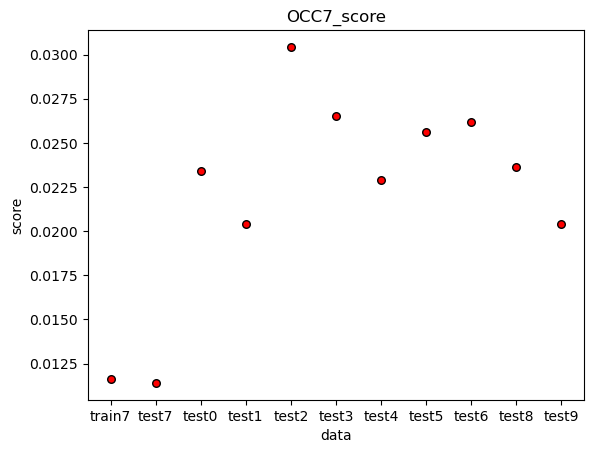

time: 188 ms (started: 2022-12-14 05:19:15 +09:00)


In [122]:
plt.xlabel("data")
plt.ylabel("score")
plt.title("OCC7_score") 
plt.scatter(x=["train7",'test7','test0','test1','test2','test3','test4','test5','test6','test8','test9'],y=score_stack,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC7/qsvdd/OCC7_score.png')
plt.show()

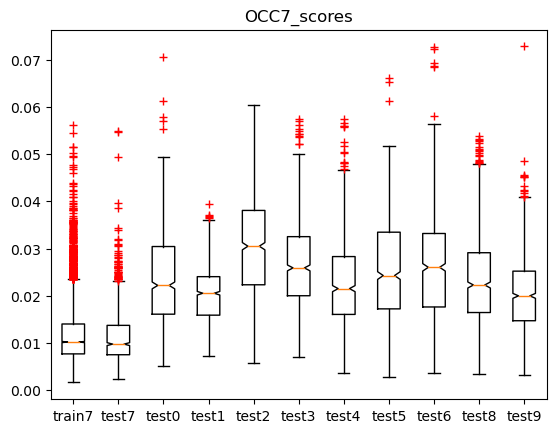

time: 359 ms (started: 2022-12-14 05:19:15 +09:00)


In [123]:
fig,ax = plt.subplots()
ax.boxplot([score_var_train,score_var_test0,score_var_test1,score_var_test2,score_var_test3,score_var_test4,score_var_test5,
score_var_test6,score_var_test7,score_var_test8,score_var_test9],notch=True,sym='r+')
plt.title('OCC7_scores')
plt.xticks([1,2,3,4,5,6,7,8,9,10,11],["train7",'test7','test0','test1','test2','test3','test4','test5','test6','test8','test9'])
plt.savefig('./img/OCC7/qsvdd/OCC7_scores.png')
plt.show()




### AUROC

In [124]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

time: 0 ns (started: 2022-12-14 05:19:15 +09:00)


In [125]:
def radius(data, center):
    res = []
    for j in range(len(data)):
        res.append(sum(abs(data - center)[j]**2))
    return res
        

time: 0 ns (started: 2022-12-14 05:19:16 +09:00)


In [126]:
radius_train0 = radius(data = predictions_exp0, center = center)
radius_test0 = radius(data = predictions_exp0_test, center = center)
radius_test1 = radius(data = predictions_exp1, center = center)
radius_test2 = radius(data = predictions_exp2, center = center)
radius_test3 = radius(data = predictions_exp3, center = center)
radius_test4 = radius(data = predictions_exp4, center = center)
radius_test5 = radius(data = predictions_exp5, center = center)
radius_test6 = radius(data = predictions_exp6, center = center)
radius_test7 = radius(data = predictions_exp7, center = center)
radius_test8 = radius(data = predictions_exp8, center = center)
radius_test9 = radius(data = predictions_exp9, center = center)

time: 3.14 s (started: 2022-12-14 05:19:16 +09:00)


In [127]:
y_pred0 = np.array(radius_test0)
y_true0 = np.zeros(len(radius_test0), dtype=int)
y_pred1 = np.array(radius_test1)
y_true1 = np.ones(len(radius_test1), dtype=int)
y_pred2 = np.array(radius_test2)
y_true2 = np.ones(len(radius_test2), dtype=int)
y_pred3 = np.array(radius_test3)
y_true3 = np.ones(len(radius_test3), dtype=int)
y_pred4 = np.array(radius_test4)
y_true4 = np.ones(len(radius_test4), dtype=int)
y_pred5 = np.array(radius_test5)
y_true5 = np.ones(len(radius_test5), dtype=int)
y_pred6 = np.array(radius_test6)
y_true6 = np.ones(len(radius_test6), dtype=int)
y_pred7 = np.array(radius_test7)
y_true7 = np.ones(len(radius_test7), dtype=int)
y_pred8 = np.array(radius_test8)
y_true8 = np.ones(len(radius_test8), dtype=int)
y_pred9 = np.array(radius_test9)
y_true9 = np.ones(len(radius_test9), dtype=int)

time: 16 ms (started: 2022-12-14 05:19:19 +09:00)


In [128]:
y_pred01 = np.concatenate((y_pred0,y_pred1),axis=None)
y_true01 = np.concatenate((y_true0,y_true1),axis=None)
y_pred02 = np.concatenate((y_pred0,y_pred2),axis=None)
y_true02 = np.concatenate((y_true0,y_true2),axis=None)
y_pred03 = np.concatenate((y_pred0,y_pred3),axis=None)
y_true03 = np.concatenate((y_true0,y_true3),axis=None)
y_pred04 = np.concatenate((y_pred0,y_pred4),axis=None)
y_true04 = np.concatenate((y_true0,y_true4),axis=None)
y_pred05 = np.concatenate((y_pred0,y_pred5),axis=None)
y_true05 = np.concatenate((y_true0,y_true5),axis=None)
y_pred06 = np.concatenate((y_pred0,y_pred6),axis=None)
y_true06 = np.concatenate((y_true0,y_true6),axis=None)
y_pred07 = np.concatenate((y_pred0,y_pred7),axis=None)
y_true07 = np.concatenate((y_true0,y_true7),axis=None)
y_pred08 = np.concatenate((y_pred0,y_pred8),axis=None)
y_true08 = np.concatenate((y_true0,y_true8),axis=None)
y_pred09 = np.concatenate((y_pred0,y_pred9),axis=None)
y_true09 = np.concatenate((y_true0,y_true9),axis=None)

time: 0 ns (started: 2022-12-14 05:19:19 +09:00)


In [129]:
# fpr, tpr, _ = roc_curve(y_true01, y_pred01)
# auc_measure = auc(fpr,tpr)
# auc_measure

time: 0 ns (started: 2022-12-14 05:19:19 +09:00)


In [130]:
fpr1, tpr1, _ = roc_curve(y_true01, y_pred01)
fpr2, tpr2, _ = roc_curve(y_true02, y_pred02)
fpr3, tpr3, _ = roc_curve(y_true03, y_pred03)
fpr4, tpr4, _ = roc_curve(y_true04, y_pred04)
fpr5, tpr5, _ = roc_curve(y_true05, y_pred05)
fpr6, tpr6, _ = roc_curve(y_true06, y_pred06)
fpr7, tpr7, _ = roc_curve(y_true07, y_pred07)
fpr8, tpr8, _ = roc_curve(y_true08, y_pred08)
fpr9, tpr9, _ = roc_curve(y_true09, y_pred09)

time: 16 ms (started: 2022-12-14 05:19:19 +09:00)


In [131]:
auc1 = roc_auc_score(y_true01,y_pred01)
auc2 = roc_auc_score(y_true02,y_pred02)
auc3 = roc_auc_score(y_true03,y_pred03)
auc4 = roc_auc_score(y_true04,y_pred04)
auc5 = roc_auc_score(y_true05,y_pred05)
auc6 = roc_auc_score(y_true06,y_pred06)
auc7 = roc_auc_score(y_true07,y_pred07)
auc8 = roc_auc_score(y_true08,y_pred08)
auc9 = roc_auc_score(y_true09,y_pred09)
auc = [auc1,auc2,auc3,auc4,auc5,auc6,auc7,auc8,auc9]

time: 16 ms (started: 2022-12-14 05:19:19 +09:00)


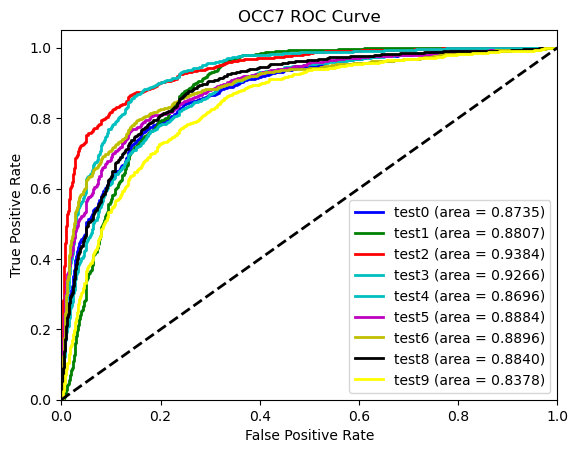

time: 250 ms (started: 2022-12-14 05:19:19 +09:00)


In [132]:
plt.figure()
lw = 2
plt.plot(fpr1,tpr1,color='b',lw=lw,label="test0 (area = %0.4f)" % auc1)
plt.plot(fpr2,tpr2,color="g",lw=lw,label="test1 (area = %0.4f)" % auc2)
plt.plot(fpr3,tpr3,color="r",lw=lw,label="test2 (area = %0.4f)" % auc3)
plt.plot(fpr4,tpr4,color="c",lw=lw,label="test3 (area = %0.4f)" % auc4)
plt.plot(fpr5,tpr5,color="c",lw=lw,label="test4 (area = %0.4f)" % auc5)
plt.plot(fpr6,tpr6,color="m",lw=lw,label="test5 (area = %0.4f)" % auc6)
plt.plot(fpr7,tpr7,color="y",lw=lw,label="test6 (area = %0.4f)" % auc7)
plt.plot(fpr8,tpr8,color="k",lw=lw,label="test8 (area = %0.4f)" % auc8)
plt.plot(fpr9,tpr9,color="yellow",lw=lw,label="test9 (area = %0.4f)" % auc9)



plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC7 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC7/qsvdd/OCC7_ROC.png')
plt.show()

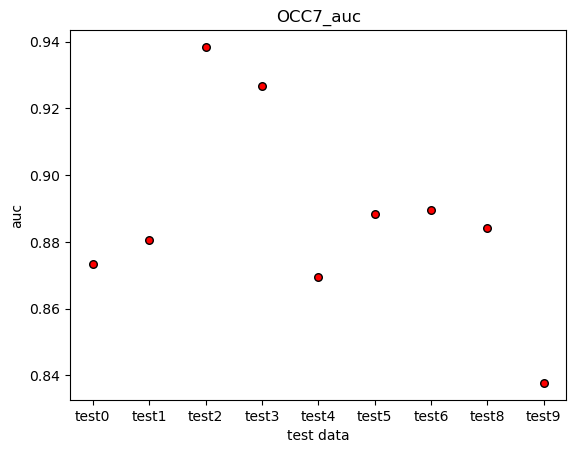

time: 140 ms (started: 2022-12-14 05:19:19 +09:00)


In [133]:
plt.xlabel("test data")
plt.ylabel("auc")
plt.title("OCC7_auc") 
plt.scatter(x=['test0','test1','test2','test3','test4','test5','test6','test8','test9'],y=auc,
            marker='o',
            s=30,
            c='red',
            edgecolors='black')
plt.savefig('./img/OCC7/qsvdd/OCC7_auc.png')
plt.show()

In [134]:
print(auc)

[0.8734882474390534, 0.8806553077701025, 0.9384246900732965, 0.9266450283160612, 0.8695559136544869, 0.8883898499845468, 0.8896127632957768, 0.8840414992130011, 0.8377588088526221]
time: 0 ns (started: 2022-12-14 05:19:19 +09:00)


In [135]:
savetxt('./img/OCC7/qsvdd/auc_OCC7.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:19:19 +09:00)


In [136]:
y_pred_ano = np.concatenate((y_pred1,y_pred2,y_pred3,y_pred4,y_pred5,y_pred6,y_pred7,y_pred8,y_pred9), axis=None)
y_true_ano = np.concatenate((y_true1,y_true2,y_true3,y_true4,y_true5,y_true6,y_true7,y_true8,y_true9), axis=None)
y_pred_all = np.concatenate((y_pred0,y_pred_ano),axis=None)
y_true_all = np.concatenate((y_true0,y_true_ano),axis=None)

time: 0 ns (started: 2022-12-14 05:19:19 +09:00)


In [137]:
fpr_all, tpr_all, _ = roc_curve(y_true_all, y_pred_all)
auc_all = roc_auc_score(y_true_all, y_pred_all)


time: 0 ns (started: 2022-12-14 05:19:19 +09:00)


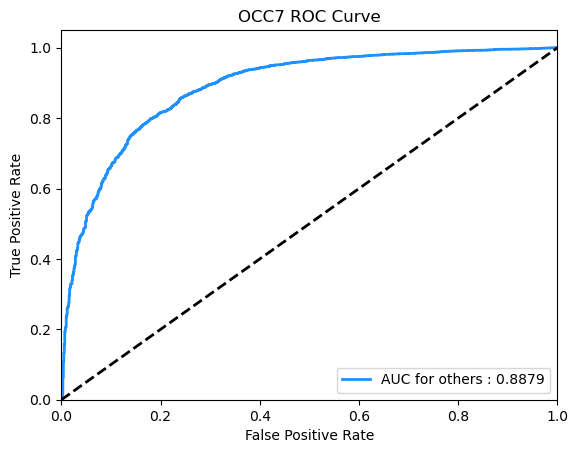

time: 156 ms (started: 2022-12-14 05:19:19 +09:00)


In [138]:
plt.figure()
lw = 2
plt.plot(fpr_all,tpr_all,color='dodgerblue',lw=lw,label="AUC for others : %0.4f" % auc_all)
plt.plot([0, 1], [0, 1], color="black", lw=lw, linestyle="--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("OCC7 ROC Curve")
plt.legend(loc="lower right")
plt.savefig('./img/OCC7/qsvdd/OCC7_ROC_all.png')
plt.show()

In [139]:
auc.append(auc_all)

time: 0 ns (started: 2022-12-14 05:19:19 +09:00)


In [140]:
auc

[0.8734882474390534,
 0.8806553077701025,
 0.9384246900732965,
 0.9266450283160612,
 0.8695559136544869,
 0.8883898499845468,
 0.8896127632957768,
 0.8840414992130011,
 0.8377588088526221,
 0.8879394998236863]

time: 0 ns (started: 2022-12-14 05:19:19 +09:00)


In [141]:
savetxt('./img/OCC7/qsvdd/auc_OCC7.txt',auc,delimiter=',', fmt='%0.6f')

time: 0 ns (started: 2022-12-14 05:19:19 +09:00)
